In [1]:
import os
import rasterio as rio
from skimage.feature import graycomatrix, graycoprops
from skimage.util import view_as_windows
import numpy as np
import matplotlib.pyplot as plt

In [2]:
IN_DIR = "../data/raw"

images_list = os.listdir(IN_DIR)

In [3]:
images = []

for img in images_list:
    img = IN_DIR + "/" + img
    raster = rio.open(img)
    band_ir = raster.read(1)
    band_r = raster.read(2)
    band_g = raster.read(3)
    band_b = raster.read(4)

    images.append([band_ir, band_r, band_g, band_b])

In [4]:
def convert_to_8bit(matrix):
    matrix_normalized = (matrix - matrix.min()) / (matrix.max() - matrix.min())
    matrix_8bit = (matrix_normalized * 255).astype(np.uint8)
    return matrix_8bit

In [5]:
img1 = images[0][1]
img1 = convert_to_8bit(img1)

255

In [6]:
window_size = (3, 3)

b = view_as_windows(img1, window_size)

In [7]:
b.shape

(971, 2180, 3, 3)

In [8]:
img_contrast = np.zeros((b.shape[0], b.shape[1]))
img_homogeneity = np.zeros((b.shape[0], b.shape[1]))

for i in range(0, b.shape[0]):
    for j in range(0, b.shape[1]):
        glcm = graycomatrix(b[i, j, :, :], [1], [0], levels=256, symmetric=True, normed=True)
        contrast = graycoprops(glcm, prop='contrast')
        homo = graycoprops(glcm, 'homogeneity')
        img_contrast[i, j] = contrast[0]
        img_homogeneity[i, j] = homo[0]

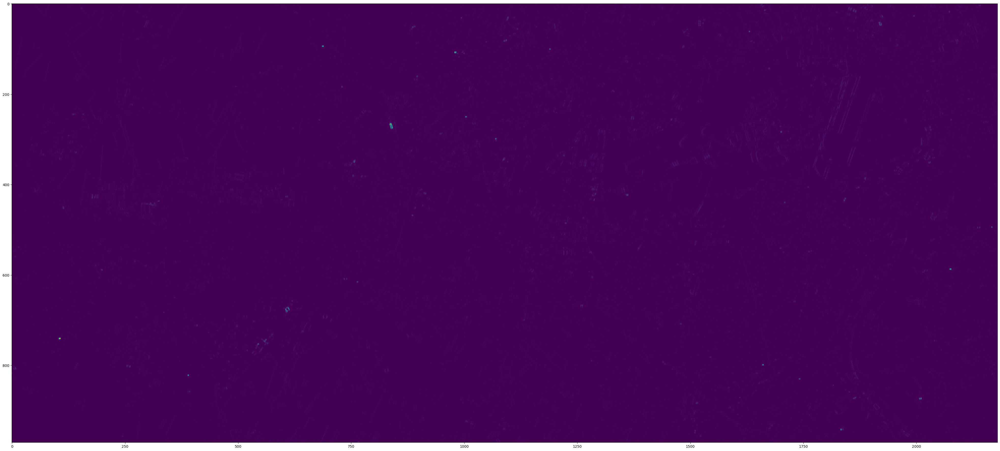

In [14]:
plt.figure(figsize = (50,25))
plt.imshow(img_contrast)

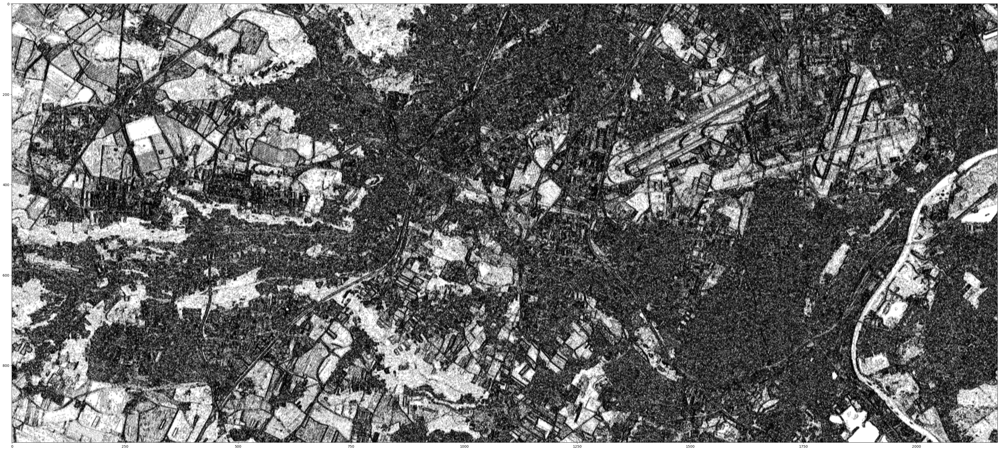

In [13]:
plt.figure(figsize = (50,25))
plt.imshow(img_homogeneity, cmap='gray')

In [26]:
glcm = graycomatrix(b[0,0,:,:], [1], [0], 256, symmetric=True, normed=True)
props = graycoprops(glcm, prop='contrast')
props[0,0]

0.16666666666666666

In [ ]:
img2 = img1.copy()

# `window_size` is the size of the sliding window
window_size = 3
border_size = window_size // 2  # This is the size of the border to ignore

# Get the size of the image
height, width = img1.shape

# Loop over the image, ignoring the border
for i in range(border_size, height - border_size):
    for j in range(border_size, width - border_size):
        # This is the sliding window
        window = img1[i - border_size:i + border_size + 1, j - border_size:j + border_size + 1]
        # calculate the GLCM
        glcm = graycomatrix(window, [1], [0], levels=img1.max())
        # calculate the contrast
        contrast = graycoprops(glcm, 'contrast')
        img2[i, j] = contrast

plt.imshow(img2, cmap='gray')

        

ValueError: The maximum grayscale value in the image should be smaller than the number of levels.

In [ ]:
import gdal, osr
import numpy as np
from scipy.interpolate import RectBivariateSpline
from numpy.lib.stride_tricks import as_strided as ast
import dask.array as da
from joblib import Parallel, delayed, cpu_count
import os
from skimage.feature import greycomatrix, greycoprops

def im_resize(im,Nx,Ny):
    '''
    resize array by bivariate spline interpolation
    '''
    ny, nx = np.shape(im)
    xx = np.linspace(0,nx,Nx)
    yy = np.linspace(0,ny,Ny)

    try:
        im = da.from_array(im, chunks=1000)   #dask implementation
    except:
        pass

    newKernel = RectBivariateSpline(np.r_[:ny],np.r_[:nx],im)
    return newKernel(yy,xx)

def p_me(Z, win):
    '''
    loop to calculate greycoprops
    '''
    try:
        glcm = greycomatrix(Z, [5], [0], 256, symmetric=True, normed=True)
        cont = greycoprops(glcm, 'contrast')
        diss = greycoprops(glcm, 'dissimilarity')
        homo = greycoprops(glcm, 'homogeneity')
        eng = greycoprops(glcm, 'energy')
        corr = greycoprops(glcm, 'correlation')
        ASM = greycoprops(glcm, 'ASM')
        return (cont, diss, homo, eng, corr, ASM)
    except:
        return (0,0,0,0,0,0)


def read_raster(in_raster):
    in_raster=in_raster
    ds = gdal.Open(in_raster)
    data = ds.GetRasterBand(1).ReadAsArray()
    data[data<=0] = np.nan
    gt = ds.GetGeoTransform()
    xres = gt[1]
    yres = gt[5]

    # get the edge coordinates and add half the resolution 
    # to go to center coordinates
    xmin = gt[0] + xres * 0.5
    xmax = gt[0] + (xres * ds.RasterXSize) - xres * 0.5
    ymin = gt[3] + (yres * ds.RasterYSize) + yres * 0.5
    ymax = gt[3] - yres * 0.5
    del ds
    # create a grid of xy coordinates in the original projection
    xx, yy = np.mgrid[xmin:xmax+xres:xres, ymax+yres:ymin:yres]
    return data, xx, yy, gt

def norm_shape(shap):
   '''
   Normalize numpy array shapes so they're always expressed as a tuple,
   even for one-dimensional shapes.
   '''
   try:
      i = int(shap)
      return (i,)
   except TypeError:
      # shape was not a number
      pass

   try:
      t = tuple(shap)
      return t
   except TypeError:
      # shape was not iterable
      pass

   raise TypeError('shape must be an int, or a tuple of ints')

def sliding_window(a, ws, ss = None, flatten = True):
    '''
    Source: http://www.johnvinyard.com/blog/?p=268#more-268
    Parameters:
        a  - an n-dimensional numpy array
        ws - an int (a is 1D) or tuple (a is 2D or greater) representing the size 
             of each dimension of the window
        ss - an int (a is 1D) or tuple (a is 2D or greater) representing the 
             amount to slide the window in each dimension. If not specified, it
             defaults to ws.
        flatten - if True, all slices are flattened, otherwise, there is an 
                  extra dimension for each dimension of the input.

    Returns
        an array containing each n-dimensional window from a
    '''      
    if None is ss:
        # ss was not provided. the windows will not overlap in any direction.
        ss = ws
    ws = norm_shape(ws)
    ss = norm_shape(ss)
    # convert ws, ss, and a.shape to numpy arrays
    ws = np.array(ws)
    ss = np.array(ss)
    shap = np.array(a.shape)
    # ensure that ws, ss, and a.shape all have the same number of dimensions
    ls = [len(shap),len(ws),len(ss)]
    if 1 != len(set(ls)):
        raise ValueError(\
        'a.shape, ws and ss must all have the same length. They were %s' % str(ls))

    # ensure that ws is smaller than a in every dimension
    if np.any(ws > shap):
        raise ValueError(\
        'ws cannot be larger than a in any dimension.\
     a.shape was %s and ws was %s' % (str(a.shape),str(ws)))

    # how many slices will there be in each dimension?
    newshape = norm_shape(((shap - ws) // ss) + 1)


    # the shape of the strided array will be the number of slices in each dimension
    # plus the shape of the window (tuple addition)
    newshape += norm_shape(ws)


    # the strides tuple will be the array's strides multiplied by step size, plus
    # the array's strides (tuple addition)
    newstrides = norm_shape(np.array(a.strides) * ss) + a.strides
    a = ast(a,shape = newshape,strides = newstrides)
    if not flatten:
        return a
    # Collapse strided so that it has one more dimension than the window.  I.e.,
    # the new array is a flat list of slices.
    meat = len(ws) if ws.shape else 0
    firstdim = (np.product(newshape[:-meat]),) if ws.shape else ()
    dim = firstdim + (newshape[-meat:])
    # remove any dimensions with size 1
    dim = filter(lambda i : i != 1,dim)

    return a.reshape(dim), newshape

def CreateRaster(xx,yy,std,gt,proj,driverName,outFile):  
    '''
    Exports data to GTiff Raster
    '''
    std = np.squeeze(std)
    std[np.isinf(std)] = -99
    driver = gdal.GetDriverByName(driverName)
    rows,cols = np.shape(std)
    ds = driver.Create( outFile, cols, rows, 1, gdal.GDT_Float32)      
    if proj is not None:  
        ds.SetProjection(proj.ExportToWkt()) 
    ds.SetGeoTransform(gt)
    ss_band = ds.GetRasterBand(1)
    ss_band.WriteArray(std)
    ss_band.SetNoDataValue(-99)
    ss_band.FlushCache()
    ss_band.ComputeStatistics(False)
    del ds


#Stuff to change

if __name__ == '__main__':  
    win_sizes = [3]
    for win_size in win_sizes[:]:   
        in_raster = #Path to input raster
        win = win_size
        meter = str(win/4)

        #Define output file names
        contFile = 
        dissFile = 
        homoFile = 
        energyFile = 
        corrFile =
        ASMFile = 



        merge, xx, yy, gt = read_raster(in_raster)

        merge[np.isnan(merge)] = 0

        Z,ind = sliding_window(merge,(win,win),(win,win))

        Ny, Nx = np.shape(merge)

        w = Parallel(n_jobs = cpu_count(), verbose=0)(delayed(p_me)(Z[k]) for k in range(len(Z)))

        cont = [a[0] for a in w]
        diss = [a[1] for a in w]
        homo = [a[2] for a in w]
        eng  = [a[3] for a in w]
        corr = [a[4] for a in w]
        ASM  = [a[5] for a in w]


        #Reshape to match number of windows
        plt_cont = np.reshape(cont , ( ind[0], ind[1] ) )
        plt_diss = np.reshape(diss , ( ind[0], ind[1] ) )
        plt_homo = np.reshape(homo , ( ind[0], ind[1] ) )
        plt_eng = np.reshape(eng , ( ind[0], ind[1] ) )
        plt_corr = np.reshape(corr , ( ind[0], ind[1] ) )
        plt_ASM =  np.reshape(ASM , ( ind[0], ind[1] ) )
        del cont, diss, homo, eng, corr, ASM

        #Resize Images to receive texture and define filenames
        contrast = im_resize(plt_cont,Nx,Ny)
        contrast[merge==0]=np.nan
        dissimilarity = im_resize(plt_diss,Nx,Ny)
        dissimilarity[merge==0]=np.nan    
        homogeneity = im_resize(plt_homo,Nx,Ny)
        homogeneity[merge==0]=np.nan
        energy = im_resize(plt_eng,Nx,Ny)
        energy[merge==0]=np.nan
        correlation = im_resize(plt_corr,Nx,Ny)
        correlation[merge==0]=np.nan
        ASM = im_resize(plt_ASM,Nx,Ny)
        ASM[merge==0]=np.nan
        del plt_cont, plt_diss, plt_homo, plt_eng, plt_corr, plt_ASM


        del w,Z,ind,Ny,Nx

        driverName= 'GTiff'    
        epsg_code=26949
        proj = osr.SpatialReference()
        proj.ImportFromEPSG(epsg_code)

        CreateRaster(xx, yy, contrast, gt, proj,driverName,contFile) 
        CreateRaster(xx, yy, dissimilarity, gt, proj,driverName,dissFile)
        CreateRaster(xx, yy, homogeneity, gt, proj,driverName,homoFile)
        CreateRaster(xx, yy, energy, gt, proj,driverName,energyFile)
        CreateRaster(xx, yy, correlation, gt, proj,driverName,corrFile)
        CreateRaster(xx, yy, ASM, gt, proj,driverName,ASMFile)

        del contrast, merge, xx, yy, gt, meter, dissimilarity, homogeneity, energy, correlation, ASM

In [ ]:
import numpy as np
from skimage import io
from scipy import stats
from skimage.feature import greycoprops

def offset(length, angle):
    """Return the offset in pixels for a given length and angle"""
    dv = length * np.sign(-np.sin(angle)).astype(np.int32)
    dh = length * np.sign(np.cos(angle)).astype(np.int32)
    return dv, dh

def crop(img, center, win):
    """Return a square crop of img centered at center (side = 2*win + 1)"""
    row, col = center
    side = 2*win + 1
    first_row = row - win
    first_col = col - win
    last_row = first_row + side    
    last_col = first_col + side
    return img[first_row: last_row, first_col: last_col]

def cooc_maps(img, center, win, d=[1], theta=[0], levels=256):
    """
    Return a set of co-occurrence maps for different d and theta in a square 
    crop centered at center (side = 2*w + 1)
    """
    shape = (2*win + 1, 2*win + 1, len(d), len(theta))
    cooc = np.zeros(shape=shape, dtype=np.int32)
    row, col = center
    Ii = crop(img, (row, col), win)
    for d_index, length in enumerate(d):
        for a_index, angle in enumerate(theta):
            dv, dh = offset(length, angle)
            Ij = crop(img, center=(row + dv, col + dh), win=win)
            cooc[:, :, d_index, a_index] = encode_cooccurrence(Ii, Ij, levels)
    return cooc

def encode_cooccurrence(x, y, levels=256):
    """Return the code corresponding to co-occurrence of intensities x and y"""
    return x*levels + y

def decode_cooccurrence(code, levels=256):
    """Return the intensities x, y corresponding to code"""
    return code//levels, np.mod(code, levels)    

def compute_glcms(cooccurrence_maps, levels=256):
    """Compute the cooccurrence frequencies of the cooccurrence maps"""
    Nr, Na = cooccurrence_maps.shape[2:]
    glcms = np.zeros(shape=(levels, levels, Nr, Na), dtype=np.float64)
    for r in range(Nr):
        for a in range(Na):
            values, counts = np.unique(cooccurrence_maps[:, :, r, a], return_counts=True)
            # combine the values and counts
            table = np.column_stack((values, counts))  
            # table = stats.itemfreq(cooccurrence_maps[:, :, r, a])
            codes = table[:, 0]
            freqs = table[:, 1]/float(table[:, 1].sum())
            i, j = decode_cooccurrence(codes, levels=levels)
            glcms[i, j, r, a] = freqs
    return glcms

def compute_props(glcms, props=('contrast',)):
    """Return a feature vector corresponding to a set of GLCM"""
    Nr, Na = glcms.shape[2:]
    features = np.zeros(shape=(Nr, Na, len(props)))
    for index, prop_name in enumerate(props):
        features[:, :, index] = greycoprops(glcms, prop_name)
    return features.ravel()

def haralick_features(img, win, d, theta, levels, props):
    """Return a map of Haralick features (one feature vector per pixel)"""
    rows, cols = img.shape
    margin = win + max(d)
    arr = np.pad(img, margin, mode='reflect')
    n_features = len(d) * len(theta) * len(props)
    feature_map = np.zeros(shape=(rows, cols, n_features), dtype=np.float64)
    for m in range(rows):
        for n in range(cols):
            coocs = cooc_maps(arr, (m + margin, n + margin), win, d, theta, levels)
            glcms = compute_glcms(coocs, levels)
            feature_map[m, n, :] = compute_props(glcms, props)
    return feature_map

In [1]:
d = (1, 2)
theta = (0, 3*np.pi/4)
props = 'contrast'
levels = 256
win = 3

feature_map = haralick_features(img1, win, d, theta, levels, props)

NameError: name 'np' is not defined